In [71]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
import cv2
import pandas as pd
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import random
from imgaug import augmenters as iaa

In [72]:
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv('./DATA/driving_log.csv', names = columns)
pd.set_option('display.max_colwidth', 1)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,E:\autonomusCar\DATA\IMG\center_2024_06_10_12_57_29_476.jpg,E:\autonomusCar\DATA\IMG\left_2024_06_10_12_57_29_476.jpg,E:\autonomusCar\DATA\IMG\right_2024_06_10_12_57_29_476.jpg,0.0,0.0,0.0,0.000079
1,E:\autonomusCar\DATA\IMG\center_2024_06_10_12_57_29_578.jpg,E:\autonomusCar\DATA\IMG\left_2024_06_10_12_57_29_578.jpg,E:\autonomusCar\DATA\IMG\right_2024_06_10_12_57_29_578.jpg,0.0,0.0,0.0,0.000078
2,E:\autonomusCar\DATA\IMG\center_2024_06_10_12_57_29_679.jpg,E:\autonomusCar\DATA\IMG\left_2024_06_10_12_57_29_679.jpg,E:\autonomusCar\DATA\IMG\right_2024_06_10_12_57_29_679.jpg,0.0,0.0,0.0,0.000078
3,E:\autonomusCar\DATA\IMG\center_2024_06_10_12_57_29_784.jpg,E:\autonomusCar\DATA\IMG\left_2024_06_10_12_57_29_784.jpg,E:\autonomusCar\DATA\IMG\right_2024_06_10_12_57_29_784.jpg,0.0,0.0,0.0,0.000079
4,E:\autonomusCar\DATA\IMG\center_2024_06_10_12_57_29_887.jpg,E:\autonomusCar\DATA\IMG\left_2024_06_10_12_57_29_887.jpg,E:\autonomusCar\DATA\IMG\right_2024_06_10_12_57_29_887.jpg,0.0,0.0,0.0,0.000078


In [73]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_06_10_12_57_29_476.jpg,left_2024_06_10_12_57_29_476.jpg,right_2024_06_10_12_57_29_476.jpg,0.0,0.0,0.0,0.000079
1,center_2024_06_10_12_57_29_578.jpg,left_2024_06_10_12_57_29_578.jpg,right_2024_06_10_12_57_29_578.jpg,0.0,0.0,0.0,0.000078
2,center_2024_06_10_12_57_29_679.jpg,left_2024_06_10_12_57_29_679.jpg,right_2024_06_10_12_57_29_679.jpg,0.0,0.0,0.0,0.000078
3,center_2024_06_10_12_57_29_784.jpg,left_2024_06_10_12_57_29_784.jpg,right_2024_06_10_12_57_29_784.jpg,0.0,0.0,0.0,0.000079
4,center_2024_06_10_12_57_29_887.jpg,left_2024_06_10_12_57_29_887.jpg,right_2024_06_10_12_57_29_887.jpg,0.0,0.0,0.0,0.000078


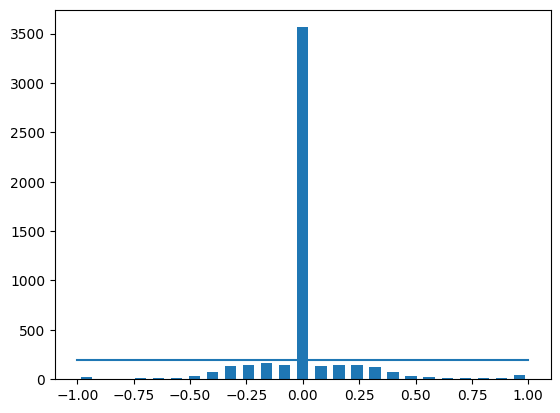

In [74]:
num_bins = 25
sample_per_bin = 200
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:] ) * 0.5
plt.bar(center, hist, width = 0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (sample_per_bin,sample_per_bin))


total data 5077
removed:  3363


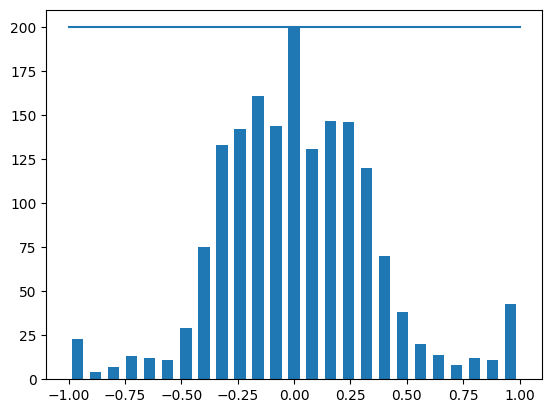

In [75]:
print("total data", len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[sample_per_bin:]
    remove_list.extend(list_)

print("removed: ", len(remove_list))
data.drop(data.index[remove_list], inplace=True)

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])), (sample_per_bin , sample_per_bin))

In [76]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_path, steerings

image_paths, steerings = load_img_steering('./DATA/IMG', data)

center      center_2024_06_10_12_57_31_227.jpg
left        left_2024_06_10_12_57_31_227.jpg  
right       right_2024_06_10_12_57_31_227.jpg 
steering   -0.413386                          
throttle    1.0                               
reverse     0.0                               
speed       6.97908                           
Name: 17, dtype: object


C:\Users\Prathamesh Shetty\AppData\Local\Temp\ipykernel_9984\4035451515.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\Prathamesh Shetty\AppData\Local\Temp\ipykernel_9984\4035451515.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))


In [77]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print("Training Sample: {}\nValid Samples: {}".format(len(X_train),len(X_valid)))

Training Sample: 1371
Valid Samples: 343


Text(0.5, 1.0, 'Training set')

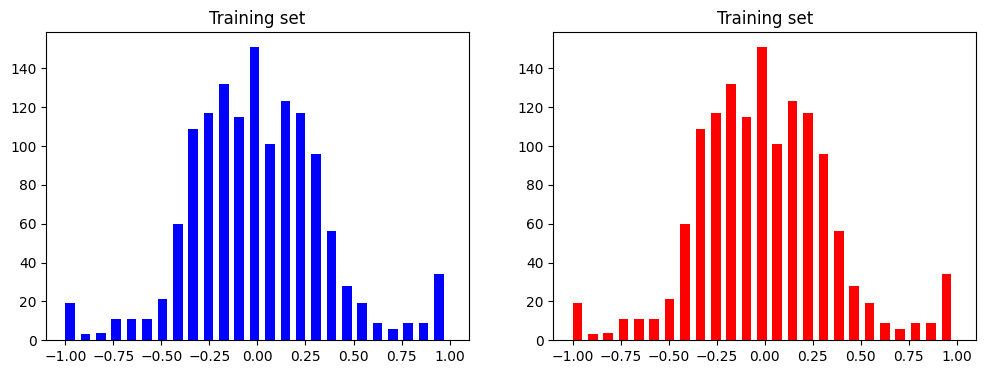

In [78]:
fig, axes = plt.subplots(1,2, figsize=(12,4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_train, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Training set')

In [79]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'Zoomed_image')

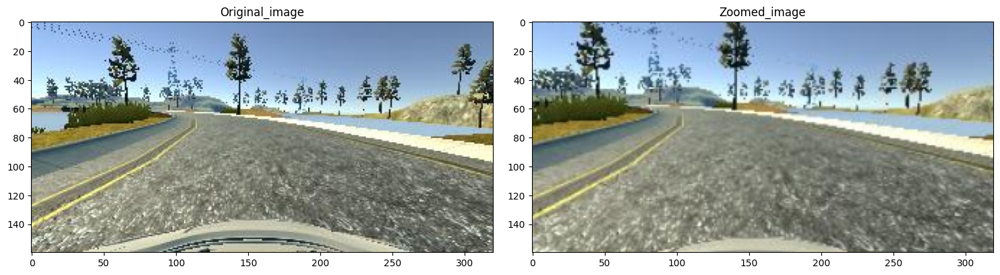

In [80]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed_image')

In [81]:
def pan(image):
    pan = iaa.Affine(translate_percent = {"x": (-0.1,0.1), "y": (-0.1,0.1)})
    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned_image')

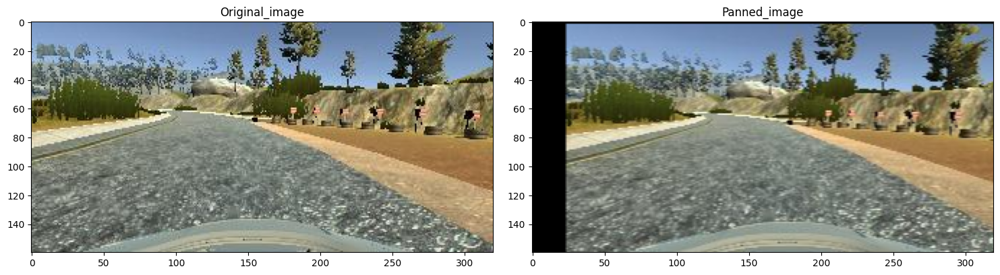

In [82]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned_image')

In [83]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2,1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Bright_image')

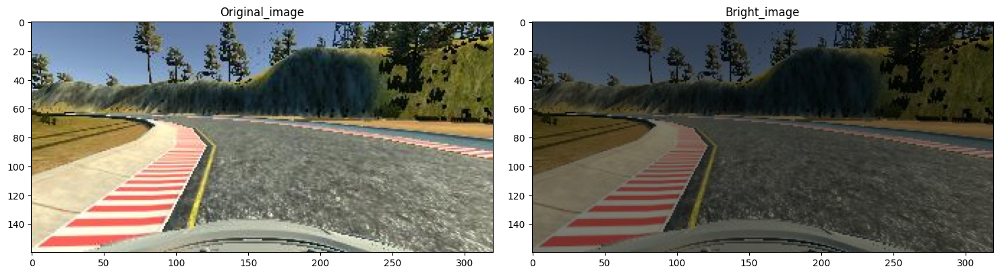

In [84]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
bright_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_image')

axs[1].imshow(bright_image)
axs[1].set_title('Bright_image')

In [85]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped_image - Steering Angle0.2568671')

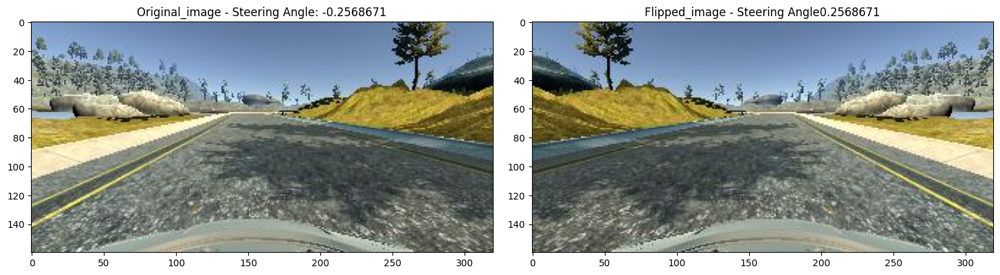

In [86]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_image - ' + 'Steering Angle: '+ str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped_image - ' + 'Steering Angle'+ str(flipped_steering_angle))

In [123]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand()<0.5:
        image = pan(image)
    if np.random.rand()<0.5:
        image = zoom(image)
    if np.random.rand()<0.5:
        image = img_random_brightness(image)
    if np.random.rand()<0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

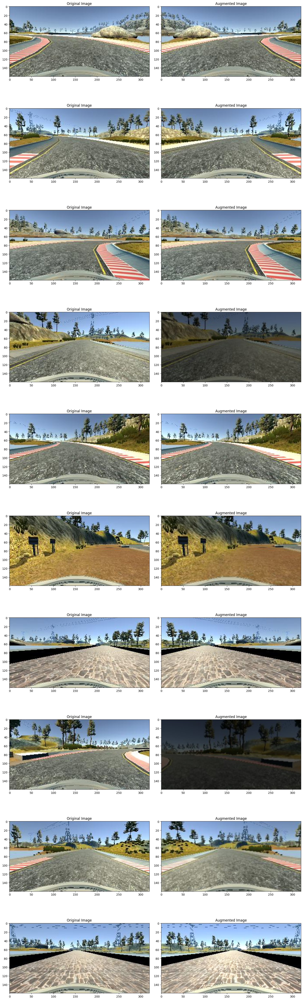

In [124]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15,50))
fig.tight_layout()

for i in range(10):
    randum = random.randint(0, len(image_paths)-1)

    random_image = image_paths[randum]
    random_steering = steerings[randum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

In [152]:
def img_preprocess(img):
    img = img[60:135, :, :]  # Crop the image
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)  # Convert color space
    img = cv2.GaussianBlur(img, (3, 3), 0)  # Apply Gaussian blur
    img = cv2.resize(img, (200, 66))  # Resize the image
    img = img / 255.0  # Normalize pixel values
    return img

Text(0.5, 1.0, 'preprocessed_image')

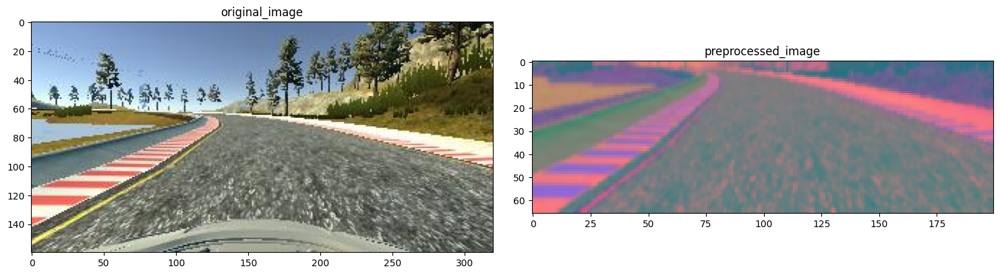

In [153]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('original_image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('preprocessed_image')

In [157]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)

            # Debugging: Check the type and shape of the image after preprocessing
            print(f'Image type: {type(im)}, Image shape: {im.shape}')

            batch_img.append(im)
            batch_steering.append(steering)

        yield (np.asarray(batch_img), np.asarray(batch_steering))

In [160]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

# Debugging: Check the type and shape of the generated batches
print(f'Type of x_train_gen: {type(x_train_gen)}, Shape: {x_train_gen.shape}')
print(f'Type of x_valid_gen: {type(x_valid_gen)}, Shape: {x_valid_gen.shape}')

# Ensure x_train_gen and x_valid_gen are arrays and have appropriate shape
if isinstance(x_train_gen, np.ndarray) and isinstance(x_valid_gen, np.ndarray):
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    fig.tight_layout()

    axs[0].imshow(x_train_gen[0])
    axs[0].set_title('Training Image')

    axs[1].imshow(x_valid_gen[0])
    axs[1].set_title('Validation Image')
else:
    print("The generated data is not in the correct format.")

AttributeError: 'numpy.ndarray' object has no attribute 'read'

In [135]:
X_train = np.array(list(map(img_preprocess, X_train)))
X_valid = np.array(list(map(img_preprocess, X_valid)))

AttributeError: 'numpy.ndarray' object has no attribute 'read'

(1371, 66, 200, 3)


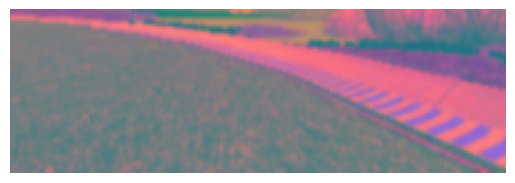

In [94]:
plt.imshow(X_train[random.randint(0, len(X_train)-1)])
plt.axis('off')
print(X_train.shape)

In [95]:
def nvidia_model():
 
    model = Sequential()
    
    model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))
    
    model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Dropout(0.5))
    
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dropout(0.5))
    
    
    model.add(Dense(50, activation='elu'))
    model.add(Dropout(0.5))

    model.add(Dense(10, activation ='elu'))
    model.add(Dropout(0.5))
    
    model.add(Dense(1))
    
    
    optimizer= Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    
    return model

In [96]:
model = nvidia_model()
print(model.summary())

C:\Users\Prathamesh Shetty\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1, 18, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [97]:
history = model.fit(X_train, y_train, epochs=30, validation_data=(X_valid, y_valid), batch_size= 100, verbose= 1, shuffle= 1)

Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.6058 - val_loss: 0.1222
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1777 - val_loss: 0.1155
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1512 - val_loss: 0.1087
Epoch 4/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1479 - val_loss: 0.1080
Epoch 5/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1384 - val_loss: 0.1051
Epoch 6/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.1206 - val_loss: 0.1039
Epoch 7/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1212 - val_loss: 0.0994
Epoch 8/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1160 - val_loss: 0.1052
Epoch 9/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.1160 - val_loss: 0.0956
Epoch 10/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.1226 - val_loss: 0.0980
Epoch 11/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.1107 - val_loss: 0.0945
Epoch 12/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1

Text(0.5, 0, 'Epoch')

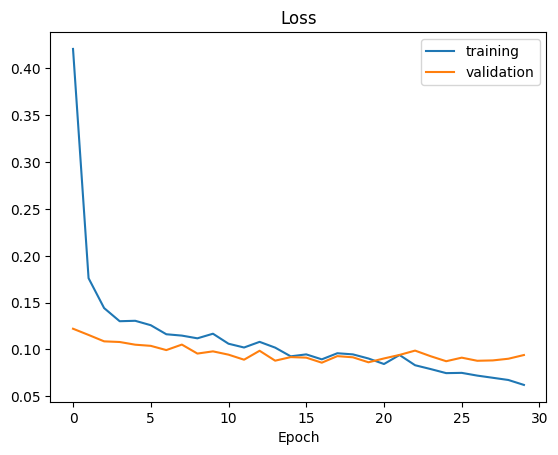

In [98]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [99]:
model.save('model.h5')